In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report,precision_score,recall_score
import pickle


In [2]:
# import the churn_data 
df=pd.read_csv(r"C:\Users\admin\Downloads\churn.csv")
df

,churn,accountlength,internationalplan,voicemailplan,numbervmailmessages,totaldayminutes,totaldaycalls,totaldaycharge,totaleveminutes,totalevecalls,totalevecharge,totalnightminutes,totalnightcalls,totalnightcharge,totalintlminutes,totalintlcalls,totalintlcharge,numbercustomerservicecalls
0,No,128,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
1,No,107,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
2,No,137,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
3,No,84,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
4,No,75,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,No,50,no,yes,40,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,9.9,5,2.67,2
4996,Yes,152,no,no,0,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,14.7,2,3.97,3
4997,No,61,no,no,0,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,13.6,4,3.67,1
4998,No,109,no,no,0,188.8,67,32.10,171.7,92,14.59,224.4,89,10.10,8.5,6,2.30,0


In [3]:
df.columns

Index(['churn', 'accountlength', 'internationalplan', 'voicemailplan',
       'numbervmailmessages', 'totaldayminutes', 'totaldaycalls',
       'totaldaycharge', 'totaleveminutes', 'totalevecalls', 'totalevecharge',
       'totalnightminutes', 'totalnightcalls', 'totalnightcharge',
       'totalintlminutes', 'totalintlcalls', 'totalintlcharge',
       'numbercustomerservicecalls'],
      dtype='object')

In [4]:
#Describetive Statistics
df.describe()

,accountlength,numbervmailmessages,totaldayminutes,totaldaycalls,totaldaycharge,totaleveminutes,totalevecalls,totalevecharge,totalnightminutes,totalnightcalls,totalnightcharge,totalintlminutes,totalintlcalls,totalintlcharge,numbercustomerservicecalls
count,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,100.25860,7.755200,180.288900,100.029400,30.649668,200.636560,100.191000,17.054322,200.391620,99.919200,9.017732,10.261780,4.435200,2.771196,1.570400
std,39.69456,13.546393,53.894699,19.831197,9.162069,50.551309,19.826496,4.296843,50.527789,19.958686,2.273763,2.761396,2.456788,0.745514,1.306363
min,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.00000,0.000000,143.700000,87.000000,24.430000,166.375000,87.000000,14.140000,166.900000,87.000000,7.510000,8.500000,3.000000,2.300000,1.000000
50%,100.00000,0.000000,180.100000,100.000000,30.620000,201.000000,100.000000,17.090000,200.400000,100.000000,9.020000,10.300000,4.000000,2.780000,1.000000
75%,127.00000,17.000000,216.200000,113.000000,36.750000,234.100000,114.000000,19.900000,234.700000,113.000000,10.560000,12.000000,6.000000,3.240000,2.000000
max,243.00000,52.000000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [5]:
# Drop unwanted columns
df.drop(["internationalplan","voicemailplan"],axis=1,inplace=True)
df

,churn,accountlength,numbervmailmessages,totaldayminutes,totaldaycalls,totaldaycharge,totaleveminutes,totalevecalls,totalevecharge,totalnightminutes,totalnightcalls,totalnightcharge,totalintlminutes,totalintlcalls,totalintlcharge,numbercustomerservicecalls
0,No,128,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
1,No,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
2,No,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
3,No,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
4,No,75,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,No,50,40,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,9.9,5,2.67,2
4996,Yes,152,0,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,14.7,2,3.97,3
4997,No,61,0,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,13.6,4,3.67,1
4998,No,109,0,188.8,67,32.10,171.7,92,14.59,224.4,89,10.10,8.5,6,2.30,0


In [6]:
# check the missing valus in data set
df.isnull().sum()


churn                         0
accountlength                 0
numbervmailmessages           0
totaldayminutes               0
totaldaycalls                 0
totaldaycharge                0
totaleveminutes               0
totalevecalls                 0
totalevecharge                0
totalnightminutes             0
totalnightcalls               0
totalnightcharge              0
totalintlminutes              0
totalintlcalls                0
totalintlcharge               0
numbercustomerservicecalls    0
dtype: int64

<AxesSubplot:>

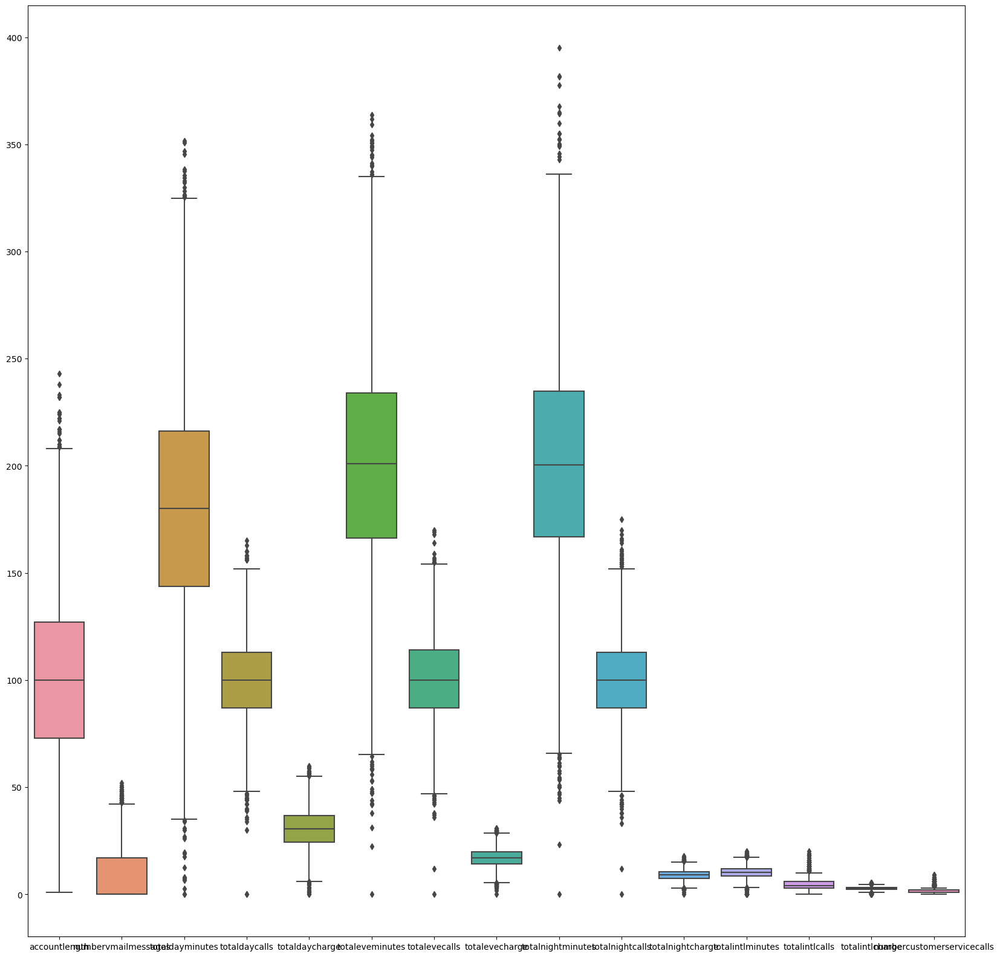

In [7]:
# check an Outlier in the data set using boxplot
fig ,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = df , ax = ax)

In [8]:
#Capping the Outlier using IQR(inter quantile range) method
#Outlier replacing with upper limit or lower limit

<AxesSubplot:ylabel='accountlength'>

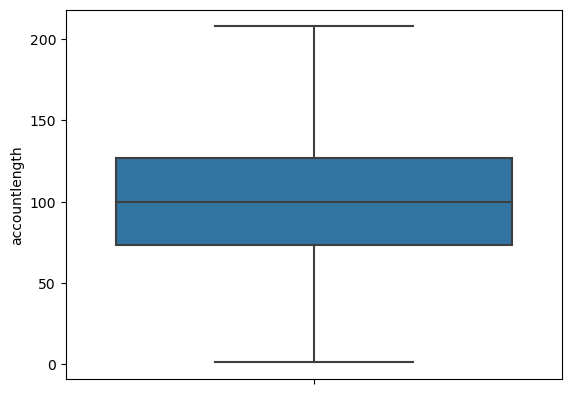

In [9]:
q3 = df["accountlength"].quantile(0.75)  
q1 = df["accountlength"].quantile(0.25)
IQR = q3 - q1
lower_limit = q1 - (IQR * 1.5)
upper_limit = q3 + (IQR * 1.5)
df["accountlength"] = np.where(df["accountlength"]> upper_limit, upper_limit,
                               np.where(df["accountlength"]< lower_limit, lower_limit,df["accountlength"]))
sns.boxplot( y="accountlength", data=df)

In [10]:
def outlier_handle(data):
    q3 = data.quantile(0.75)  
    q1 = data.quantile(0.25)
    IQR = q3 - q1
    lower_limit = q1 - (IQR * 1.5)
    upper_limit = q3 + (IQR * 1.5)
    data = np.where(data> upper_limit, upper_limit,
                               np.where(data< lower_limit, lower_limit,data))
    return data

df.numbervmailmessages=outlier_handle(df.numbervmailmessages)
df.totaldayminutes=outlier_handle(df.totaldayminutes)
df.totaldaycalls=outlier_handle(df.totaldaycalls)
df.totaldaycharge=outlier_handle(df.totaldaycharge)
df.totaleveminutes=outlier_handle(df.totaleveminutes)
df.totalevecalls=outlier_handle(df.totalevecalls)
df.totalevecharge=outlier_handle(df.totalevecharge)
df.totalnightminutes=outlier_handle(df.totalnightminutes)
df.totalnightcalls=outlier_handle(df.totalnightcalls)
df.totalnightcharge=outlier_handle(df.totalnightcharge)
df.totalintlminutes=outlier_handle(df.totalintlminutes)
df.totalintlcalls=outlier_handle(df.totalintlcalls)
df.totalintlcharge=outlier_handle(df.totalintlcharge)
df.numbercustomerservicecalls=outlier_handle(df.numbercustomerservicecalls)

In [11]:
#After handling the Outlier boxplot

<AxesSubplot:>

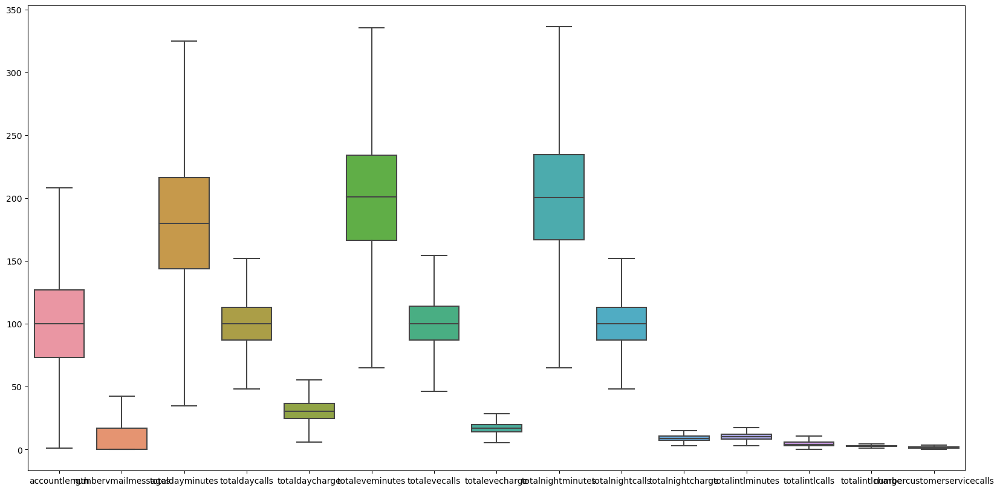

In [12]:
fig ,ax  = plt.subplots(figsize = (20,10))
sns.boxplot(data = df, ax = ax)

In [13]:
#Endcofing the Output variable using map method

In [14]:
df["churn"]=df["churn"].map({"No":0,"Yes":1})

In [15]:
df.head()

,churn,accountlength,numbervmailmessages,totaldayminutes,totaldaycalls,totaldaycharge,totaleveminutes,totalevecalls,totalevecharge,totalnightminutes,totalnightcalls,totalnightcharge,totalintlminutes,totalintlcalls,totalintlcharge,numbercustomerservicecalls
0,0,128.0,25.0,265.1,110.0,45.07,197.4000,99.0,16.78,244.7,91.0,11.01,10.0,3.0,2.70,1.0
1,0,107.0,26.0,161.6,123.0,27.47,195.5000,103.0,16.62,254.4,103.0,11.45,13.7,3.0,3.70,1.0
2,0,137.0,0.0,243.4,114.0,41.38,121.2000,110.0,10.30,162.6,104.0,7.32,12.2,5.0,3.29,0.0
3,0,84.0,0.0,299.4,71.0,50.90,64.7875,88.0,5.50,196.9,89.0,8.86,6.6,7.0,1.78,2.0
4,0,75.0,0.0,166.7,113.0,28.34,148.3000,122.0,12.61,186.9,121.0,8.41,10.1,3.0,2.73,3.0


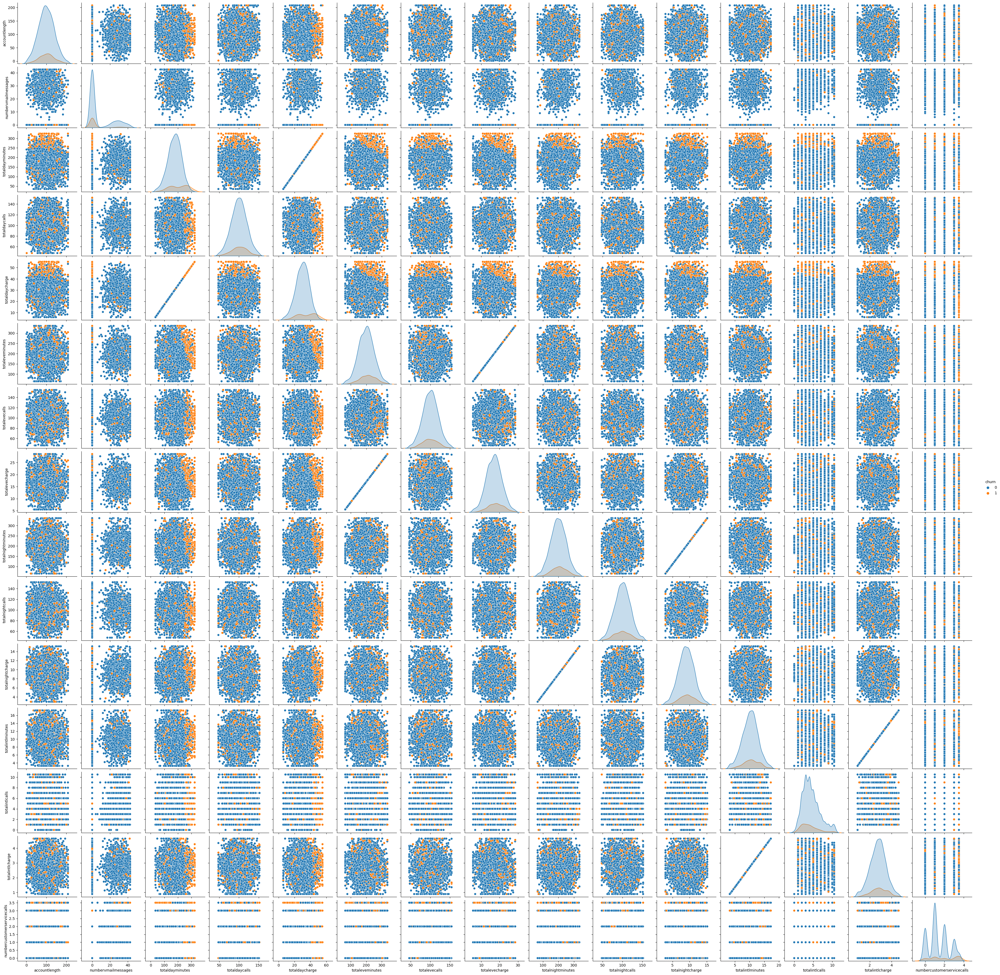

In [16]:
# to check the features are linearly seperable or not
sns.pairplot(data=df,hue="churn")

In [17]:
#To check imbalance data using value count method

In [18]:
df.churn.value_counts(normalize=True)

0    0.8586
1    0.1414
Name: churn, dtype: float64

In [19]:
#Seperate the features and Output Variabe

In [20]:
x=df.iloc[:,1:]
y=df.churn

In [21]:
# Split data set into train and test
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=100,stratify=df.churn)

In [22]:
# Scaled features on train and test data set
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
X_scaled_train=scaler.fit_transform(x_train)
X_scaled_test=scaler.transform(x_test)

In [23]:
X_scaled_train

array([[ 1.59649592, -0.56554626, -0.35147956, ..., -0.6162269 ,
        -0.47606883, -0.43744079],
       [-0.11477756,  1.38487193, -0.06630823, ..., -1.05969233,
         0.30797333,  0.46396796],
       [-0.66842486, -0.56554626, -1.43775718, ...,  0.27070397,
         0.26670796, -1.33884955],
       ...,
       [-0.99558008,  1.30985585, -0.29331962, ..., -0.6162269 ,
        -0.14594581,  1.36537672],
       [ 0.58986446, -0.56554626, -1.58597123, ..., -0.6162269 ,
         0.48678997,  0.46396796],
       [ 0.66536182, -0.56554626, -0.44153366, ..., -0.6162269 ,
        -0.62737521,  0.46396796]])

In [24]:
# Model fitting

from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier(n_neighbors=5)  
KNN=knn.fit(X_scaled_train,y_train)

# Prediction
y_pred=knn.predict(X_scaled_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [25]:
y_pred
y_t=np.array(y_test)
y_t

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [26]:
a=pd.DataFrame({"y_test":y_test,"y_pred":y_pred})
a

,y_test,y_pred
4912,0,0
2783,0,0
3594,0,0
3021,0,0
2329,0,0
...,...,...
1708,0,0
141,0,0
1416,0,0
1719,0,0


In [27]:
# Evaluation
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.90      0.99      0.94      1288
           1       0.78      0.31      0.44       212

    accuracy                           0.89      1500
   macro avg       0.84      0.65      0.69      1500
weighted avg       0.88      0.89      0.87      1500



In [28]:
# Create the picle file
pickle.dump(KNN,open("model.pkl","wb"))